In [346]:
# IMPORTS
%load_ext autoreload
%autoreload 2
%matplotlib inline



import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import sklearn
from scipy import signal
tf.config.list_physical_devices('GPU')

dtype = np.float32

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [347]:
RANDOM_STATE = 40

# Load data

In [348]:
d_small = np.load("d_small.npy").astype(dtype)
d_inv = np.load("d_inv.npy").astype(dtype)

In [349]:
# Creating poster background

# fig, axs = plt.subplots(1, 1, figsize=(45, 35))
# til = d_inv.shape[2]
# axs.imshow(d_inv[...,til//2-370].T, cmap='seismic', vmin=d_inv.min(), vmax=0.8*d_inv.max(),interpolation="bicubic")
# axs.axis('tight')
# plt.savefig("output.png")

#### Checking:

In [350]:
print(d_small.shape,d_inv.shape)

(249, 468, 351) (249, 468, 351)


In [351]:
def waveplot(t,y, zero = 0):
    plt.figure(figsize=(30,2))
    plt.plot( t, y, lw=2, color='black', alpha=0.5)
    plt.fill_between(t, y, zero,
                 where = (y < zero),
                 color = 'red', alpha = 0.5)
    plt.fill_between(t, y, zero,
                 where = (y > zero),
                 color = 'blue', alpha = 0.5)
    plt.xlabel( 'two-way time (s)', fontsize = 14)
    plt.ylabel('amplitude', fontsize = 14)
    plt.xlim((min(t),max(t)))
    plt.ylim((min(y),max(y)))
    plt.grid()

    plt.show()

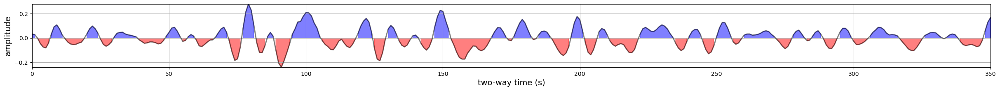

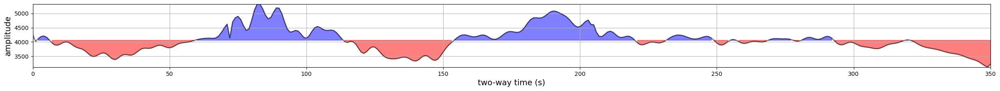

In [352]:
waveplot(range(len(d_small[0,0])),d_small[0,0])
waveplot(range(len(d_inv[0,0])),d_inv[0,0], zero = d_inv[0,0].mean())


## Data redimensioning and downsampling:

We will convert our 3d data to very long 2d data, saving Z axis as it is.

In [353]:
def convert_to_2d(data):
    """This function will flatten data except for Z axis
    Numpy array with shape (2, 3, 4) -> (6, 4)
    """

    return np.reshape(data, (-1, data.shape[-1]))

Other than that, considering volumness of our data, it makes sense to downsample data

In [354]:
il_resampling, xl_resampling, time_resampling = 3, 3, 2
x = d_small[::il_resampling,::xl_resampling,::time_resampling]
x = convert_to_2d(x)

y = d_inv[::il_resampling,::xl_resampling,::time_resampling]
y = convert_to_2d(y)

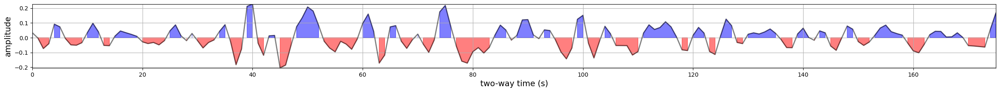

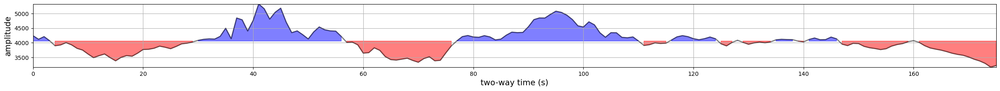

In [355]:
waveplot(range(len(x[0])),x[0])
waveplot(range(len(y[0])),y[0], zero = y[0].mean())


Our long 2D amplitude data looks like this:

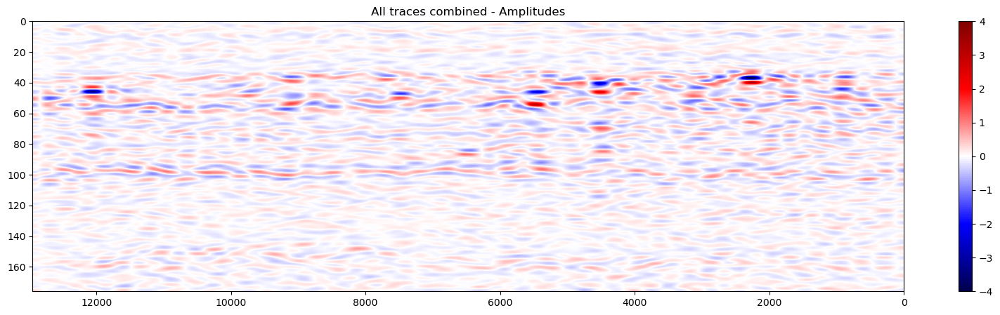

In [356]:
plt.figure(figsize=(20,5))
plt.imshow(x[::200,:,].T, cmap='seismic', aspect="auto", vmin=-4,vmax=4,
           interpolation="sinc",extent=(len(x), 0, len(x[0]), 0))
plt.colorbar()
plt.title("All traces combined - Amplitudes")

plt.show()

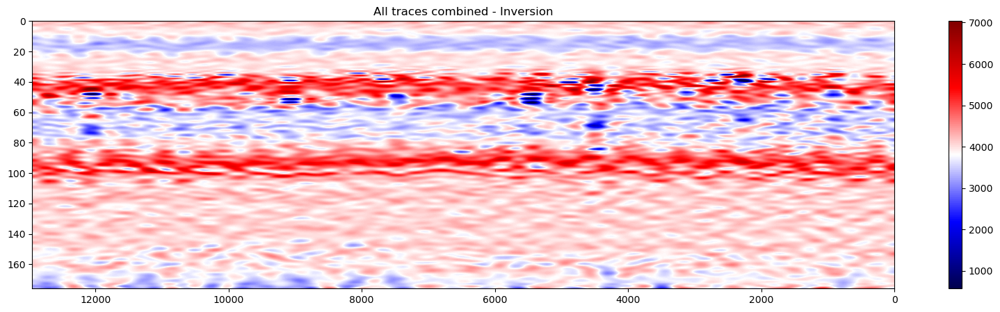

In [357]:
plt.figure(figsize=(20,5))
plt.imshow(y[::200,:,].T, cmap='seismic', aspect="auto", vmin=y.min(),vmax=0.8*y.max(),
           interpolation="sinc",extent=(len(y), 0, len(y[0]), 0))
plt.colorbar()
plt.title("All traces combined - Inversion")

plt.show()

To compare provided inversion with model inversion the are many available metrics.


Most of them are bad. Code below will proove that those metrics are inappropriate using dummy prediction.

In [358]:
from numpy.linalg import norm
 
 
# compute cosine similarity
cosine = np.dot(x.flatten(),y.flatten())/(norm(x.flatten())*norm(y.flatten()))
print("Cosine Similarity:", cosine)

Cosine Similarity: -0.03494479


Simple linear relation between Seismic amplitudes and Acoustic Impedances

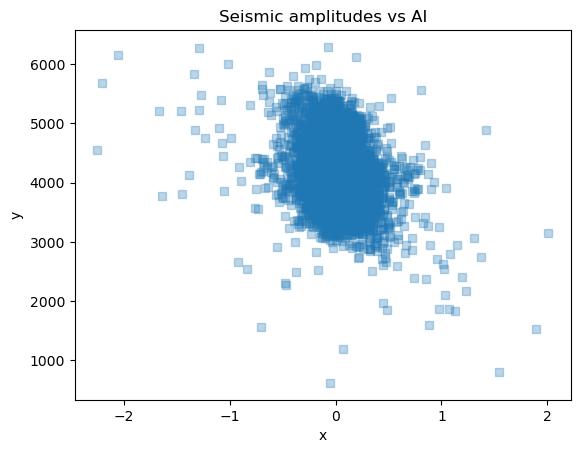

In [359]:
fig, ax = plt.subplots()
ax.plot(x[::300].flatten(), y[::300].flatten(), linewidth=0, marker='s', alpha = 0.3)
ax.set_xlabel('x')
ax.set_ylabel('y')
plt.title("Seismic amplitudes vs AI")

plt.show()

Additional analysis to check if the relation of x and y is time shifted.

According to results (as expected) it is 0-lag data

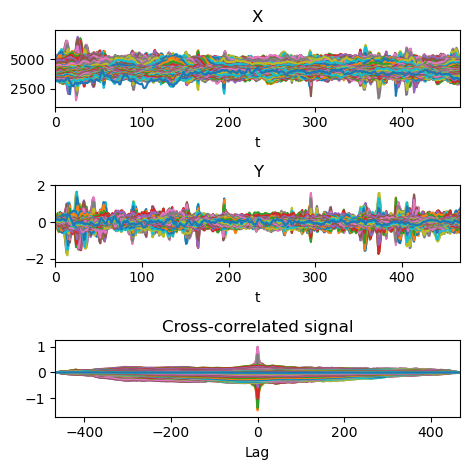

In [360]:
signal_1 = d_inv[0]
signal_2 = d_small[0]
corr = signal.correlate(signal_2, signal_1)
lags = signal.correlation_lags(len(signal_1), len(signal_2))
corr /= np.max(corr)

fig, (ax_orig, ax_noise, ax_corr) = plt.subplots(3, 1, figsize=(4.8, 4.8))
ax_orig.plot(signal_1)
ax_orig.set_title('X')
ax_orig.set_xlabel('t')
ax_noise.plot(signal_2)
ax_noise.set_title('Y')
ax_noise.set_xlabel('t')
ax_corr.plot(lags, corr)
ax_corr.set_title('Cross-correlated signal')
ax_corr.set_xlabel('Lag')
ax_orig.margins(0, 0.1)
ax_noise.margins(0, 0.1)
ax_corr.margins(0, 0.1)
fig.tight_layout()
plt.show()

In [361]:
x[0].shape

(176,)

Euclidean distance as a metric?

In [362]:
from scipy.spatial import distance
from sklearn.preprocessing import normalize

def norm_euc(x,y,plot=True):
    a = normalize([x]).flatten()
    b = normalize([y]).flatten()
    euclid_distance_a_to_b = distance.euclidean(a, b)/2
    if plot:
        fig, axes = plt.subplots(1, 1, figsize=(12, 4))
        axes.plot(a, alpha=0.7, label="a", marker="o")
        axes.plot(b, alpha=0.7, label="b", marker="D")

        # draw connecting segments between a_i and b_i used for Euclidean distance calculation
        axes.vlines(np.arange(0, len(a), 1), a, b, alpha = 0.7)
        axes.legend()
        axes.set_title("Euclidean distance from 'a' to 'b' = {:0.1f}".format(euclid_distance_a_to_b));
        # print(euclid_distance_a_to_b)
    return(euclid_distance_a_to_b)

0.7213876941059278

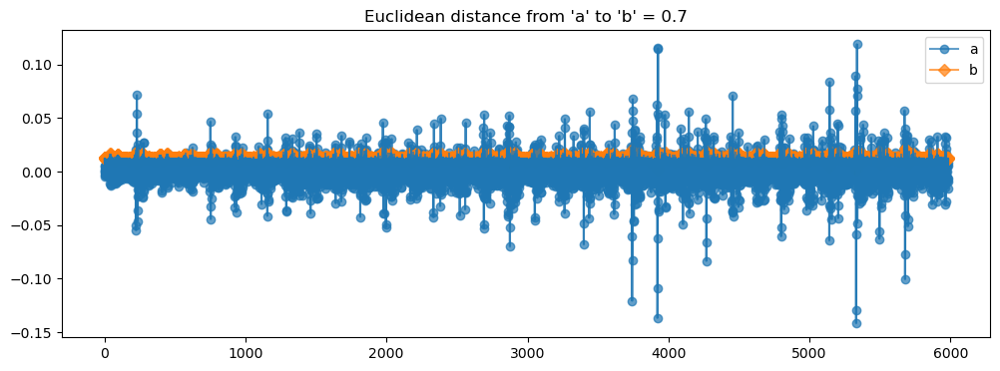

In [363]:
norm_euc(np.ravel(x[:1000:30]), np.ravel(y[:1000:30]))

We will discuss this one with dummy inversion (simple linear regression)

# Models:

## Dummy Inversion:

In [364]:
import scipy
slope, intercept, r, p, stderr = scipy.stats.linregress(np.ravel(x[::10]), np.ravel(y[::10]))

In [365]:
line = f'Regression line: y={intercept:.2f}+{slope:.2f}x, r={r:.2f}'
line


'Regression line: y=4053.74+-656.68x, r=-0.29'

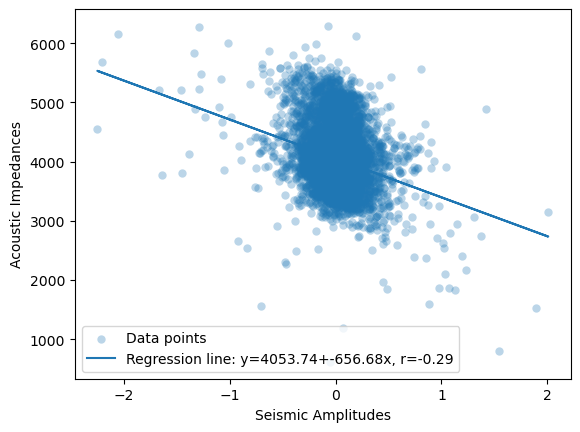

In [447]:
fig, ax = plt.subplots()
ax.scatter(x[::300].flatten(), y[::300].flatten(), linewidth=0, alpha=0.3, label='Data points')
ax.plot(x[::300].flatten(), intercept + slope * x[::300].flatten(), label=line)
ax.set_xlabel('Seismic Amplitudes')
ax.set_ylabel('Acoustic Impedances')
ax.legend(facecolor='white')
plt.show()

In [367]:
def y_dummy(x):
    return intercept + slope * x

In [368]:
d_dummy_inv = y_dummy(d_small)

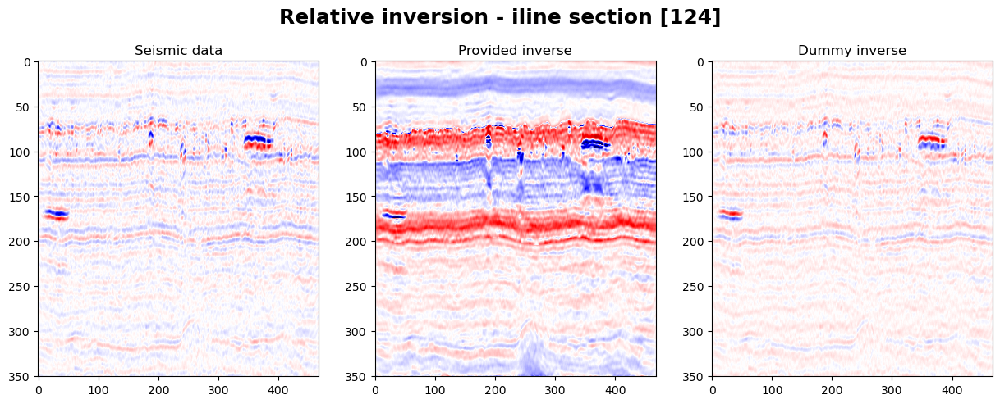

In [369]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
nil = d_small.shape[0]
fig.suptitle(f'Relative inversion - iline section [{nil//2}]', y=1.01, fontweight='bold', fontsize=18)

axs[0].imshow(d_small[nil//2].T, cmap='seismic', vmin=-4, vmax=4,)
axs[0].set_title('Seismic data')
axs[0].axis('tight')

axs[1].imshow(d_inv[nil//2].T, cmap='seismic', vmin=d_inv.min(), vmax=0.8*d_inv.max(),)
axs[1].set_title('Provided inverse')
axs[1].axis('tight')

axs[2].imshow(d_dummy_inv[nil//2].T, cmap='seismic', vmin=d_inv.min(), vmax=0.8*d_inv.max())
axs[2].set_title('Dummy inverse')
axs[2].axis('tight');

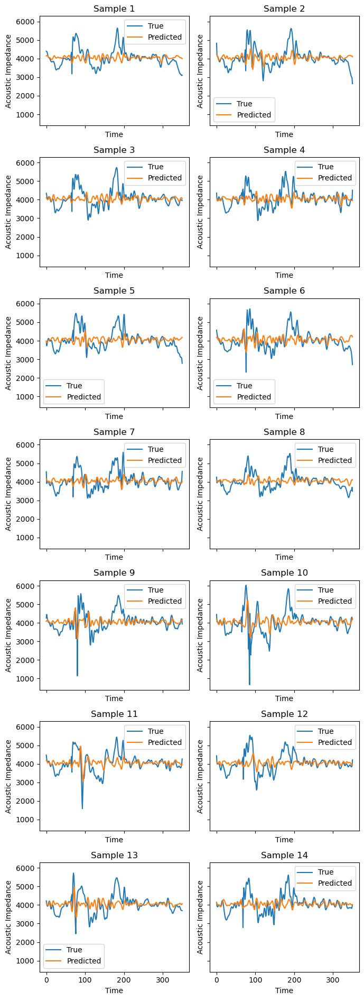

In [370]:
# Set the number of random samples to plot
num_samples = 14
ncols = 2

d_inv_reshaped = np.reshape(d_inv,(d_inv.shape[0]*d_inv.shape[1],-1))
d_dummy_reshaped = np.reshape(d_dummy_inv,(d_dummy_inv.shape[0]*d_dummy_inv.shape[1],-1))

# Randomly select samples
np.random.seed(RANDOM_STATE)
indices = np.random.choice(d_inv_reshaped.shape[0], num_samples, replace=False)

# Create subplots using plt
fig, axes = plt.subplots(nrows=num_samples//ncols, ncols=ncols, sharex=True, sharey=True, figsize=(7, 7*ncols+5))


# Plot each sample as a subplot
for i, idx in enumerate(indices):
    row_idx = i // 2
    col_idx = i % 2
    axes[row_idx, col_idx].plot(d_inv_reshaped[idx], label="True")
    axes[row_idx, col_idx].plot(d_dummy_reshaped[idx], label="Predicted")
    axes[row_idx, col_idx].set_title("Sample {}".format(i+1))
    axes[row_idx, col_idx].set_xlabel("Time")
    axes[row_idx, col_idx].set_ylabel("Acoustic Impedance")
    axes[row_idx, col_idx].legend()

plt.tight_layout()
plt.show()

In [371]:
 
# compute cosine similarity
cosine = np.dot(d_inv.flatten(),d_dummy_inv.flatten())/(norm(d_inv.flatten())*norm(d_dummy_inv.flatten()))
print("Cosine Similarity:", cosine)


Cosine Similarity: 0.9935804


In [372]:
norm_euc(np.ravel(d_inv[::30]), np.ravel(d_dummy_inv[::30]), plot=False)


0.055677492857630066

In [373]:
norm_euc_perc = lambda norm_euc: 1-norm_euc

In [374]:
norm_euc_perc(norm_euc(np.ravel(d_inv[::30]), np.ravel(d_dummy_inv[::30]), plot=False))

0.94432250714237

99% and 94% accuracies for dummy inversion, which is terrible model just looking at comparison visuals above.

Meaning those metrics are not compatible with our analysis.

In [375]:
from sklearn.metrics import mean_squared_error

In [376]:
mean_squared_error(d_inv.flatten(),d_dummy_inv.flatten())

213255.14

In [443]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import numpy as np



# Additional resampling
resample_factor=1
# Normalize X
scaler_X = StandardScaler()
xn = scaler_X.fit_transform(x[::resample_factor])
# Normalize Y
scaler_Y = StandardScaler()
yn = scaler_Y.fit_transform(y[::resample_factor])

# Split your data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(xn, yn, test_size=0.3, random_state=RANDOM_STATE)



In [378]:
X_test.shape

(3885, 176)

## Genuis vusialisation tools by me:

The functions below is not visualization tool but will be very useful for visualization simplification

In [379]:
def transform_predict(d_small, model, scaler_X, scaler_Y,time_resampling=1):
    """This function is a proof of my terrible coding,
    It takes original 3D seismic data, reshapes to 2D, then normalizes it with X scaler
    After, that model is being feed with it, returning normalized prediction which is inverted with Y scaler"""
    d_small_reshaped = convert_to_2d(d_small)[:,::time_resampling]
    d_small_reshaped_scaled = scaler_X.transform(d_small_reshaped)
    d_model = model.predict(d_small_reshaped_scaled)
    if d_model.ndim == 3:
        d_model = np.squeeze(d_model)
    d_model = scaler_Y.inverse_transform(d_model)
    d_model = np.reshape(d_model,(d_small.shape[0],d_small.shape[1],-1))
    return d_model

In [460]:
def simple_scatter(data_original, data_predicted, scaler_Y, model_name="Model"):
    """Create scatter plot of predicted vs. true values
    Expects 3D data"""
    
    do_2d = scaler_Y.transform(convert_to_2d(data_original))
    dp_2d = scaler_Y.transform(convert_to_2d(data_predicted))

    plt.scatter(do_2d.flatten(), dp_2d.flatten(),alpha=0.5)
    plt.xlabel('True Values')
    plt.ylabel(f'Predictions {model_name}')
    plt.axis('equal')
    plt.xlim(plt.xlim())
    plt.ylim(plt.ylim())
    # ampl = do_2d.max()
    ampl = 1
    _ = plt.plot([-ampl, ampl], [-ampl, ampl])
    plt.show()

In [461]:
def iline_plot(d_original,d_predicted,model_name="Model"):
    if (d_original.shape != d_predicted.shape) or (d_original.ndim != 3):
        print("bad shapes")
        return 0;

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    nil = d_small.shape[0]
    fig.suptitle(f'Relative inversion - iline section @=[{nil//2}]', y=1.01, fontweight='bold', fontsize=18)

    axs[0].imshow(d_small[nil//2].T, cmap='seismic', vmin=-4, vmax=4,)
    axs[0].set_title('Seismic data')
    axs[0].axis('tight')

    axs[1].imshow(d_original[nil//2].T, cmap='seismic', vmin=d_original.min(), vmax=0.8*d_original.max(),)
    axs[1].set_title('Provided inverse')
    axs[1].axis('tight')

    axs[2].imshow(d_predicted[nil//2].T, cmap='seismic', vmin=d_original.min(), vmax=0.8*d_original.max())
    axs[2].set_title(f'{model_name} inverse')
    axs[2].axis('tight');

    plt.show()

In [462]:
def xline_plot(d_original,d_predicted,model_name="Model"):
    if (d_original.shape != d_predicted.shape) or (d_original.ndim != 3):
        print("bad shapes")
        return 0;
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    xil = d_small.shape[1]
    fig.suptitle(f'Relative inversion - xline section @=[{xil//2}]', y=1.01, fontweight='bold', fontsize=18)

    axs[0].imshow(d_small[:,xil//2].T, cmap='seismic', vmin=-4, vmax=4,)
    axs[0].set_title('Seismic data')
    axs[0].axis('tight')

    axs[1].imshow(d_original[:,xil//2].T, cmap='seismic', vmin=d_original.min(), vmax=0.8*d_original.max(),)
    axs[1].set_title('Provided inverse')
    axs[1].axis('tight')

    axs[2].imshow(d_predicted[:,xil//2].T, cmap='seismic', vmin=d_original.min(), vmax=0.8*d_original.max())
    axs[2].set_title(f'{model_name} inverse')
    axs[2].axis('tight');

    plt.show()

In [463]:
def time_slice(d_original,d_predicted,model_name="Model"):
    if (d_original.shape != d_predicted.shape) or (d_original.ndim != 3):
        print("bad shapes")
        return 0;

    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    til = d_original.shape[2]
    fig.suptitle(f'Relative inversion - time section @=[{til//2}]', y=1.01, fontweight='bold', fontsize=18)

    axs[0].imshow(d_original[...,til//2].T, cmap='seismic', vmin=d_original.min(), vmax=0.8*d_original.max(),)
    axs[0].set_title('Provided inverse')
    axs[0].axis('tight')

    axs[1].imshow(d_predicted[...,til//2].T, cmap='seismic', vmin=d_original.min(), vmax=0.8*d_original.max())
    axs[1].set_title(f'{model_name} inverse')
    axs[1].axis('tight');

    plt.show()

In [471]:
def plot_samples_table(data_original, data_predicted, num_samples=14, ncols = 2, model_name="Model"):
    """Expects 2D/3D data of predictions and expected values for randomly chosen traces
    """
    if(data_original.ndim == 3):
        do_2d = convert_to_2d(data_original)
    if(data_predicted.ndim == 3):
        dp_2d = convert_to_2d(data_predicted)

    # Randomly select samples
    np.random.seed(RANDOM_STATE)
    indices = np.random.choice(do_2d.shape[0], num_samples, replace=False)

    # Create subplots using plt
    fig, axes = plt.subplots(nrows=num_samples//ncols, ncols=ncols, sharex=True, sharey=True, figsize=(7, 7*ncols+5))
    fig.suptitle(f'Randomly chosen traces, {model_name}', fontsize=12, y=1.01)
    # Plot each sample as a subplot
    for i, idx in enumerate(indices):
        row_idx = i // 2
        col_idx = i % 2
        axes[row_idx, col_idx].plot(do_2d[idx], label="True")
        axes[row_idx, col_idx].plot(dp_2d[idx], label="Predicted")
        axes[row_idx, col_idx].set_title("Sample {}".format(i+1))
        axes[row_idx, col_idx].set_xlabel("Time")
        axes[row_idx, col_idx].set_ylabel("Acoustic Impedance")
        axes[row_idx, col_idx].legend()

    plt.tight_layout()
    plt.show()

In [465]:
def model_plotter(data_original, data_predicted, plot_types = ["all"], model_name="Model", scaler_Y=scaler_Y):
    """This function is used to visualize 3D model predictions and compare with original data
    plot_types may include "all" or "samples_table","simple_scatter","iline_plot","xline_plot","time_slice"
    """
    if np.isin("samples_table",plot_types) or np.isin("all",plot_types):plot_samples_table(data_original, data_predicted, model_name=model_name)
    if np.isin("simple_scatter",plot_types) or np.isin("all",plot_types):simple_scatter(data_original, data_predicted,scaler_Y,model_name=model_name)
    if np.isin("iline_plot",plot_types) or np.isin("all",plot_types):iline_plot(data_original,data_predicted,model_name=model_name)
    if np.isin("xline_plot",plot_types) or np.isin("all",plot_types):xline_plot(data_original,data_predicted,model_name=model_name)
    if np.isin("time_slice",plot_types) or np.isin("all",plot_types):time_slice(data_original,data_predicted,model_name=model_name)
    


## Linear Regressor:

In [386]:
from sklearn.linear_model import LinearRegression

# Create a linear regression model and fit it to the training data
lr = LinearRegression()
lr.fit(X_train, y_train)

# Predict acoustic impedances using the test data
y_pred_lr = lr.predict(X_test)

# Evaluate the model performance using R-squared
mse = mean_squared_error(y_test, y_pred_lr)
print("MSR: {:.4f}".format(mse))

MSR: 0.1521


In [387]:
d_lr = transform_predict(d_small[...,::time_resampling], lr, scaler_X, scaler_Y)

### Visuals:

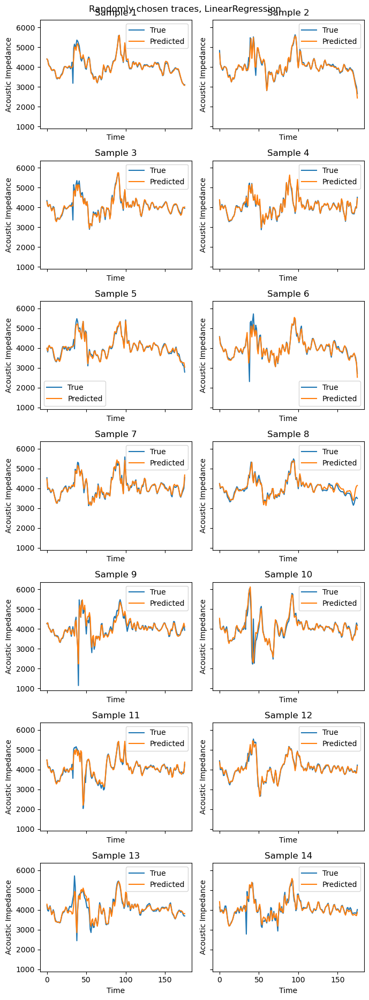

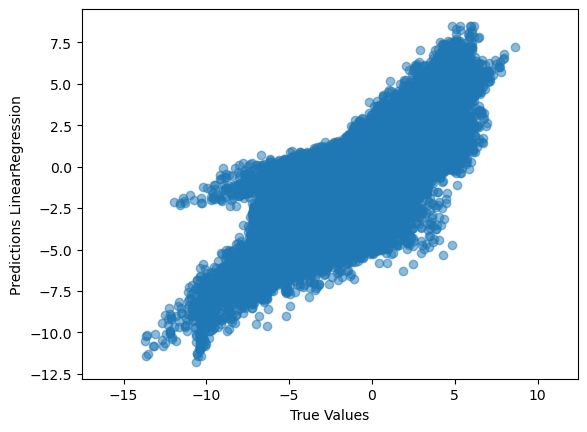

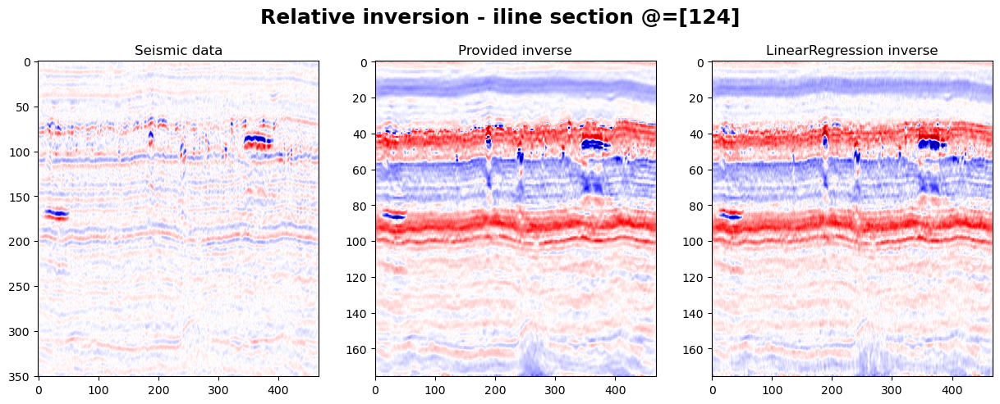

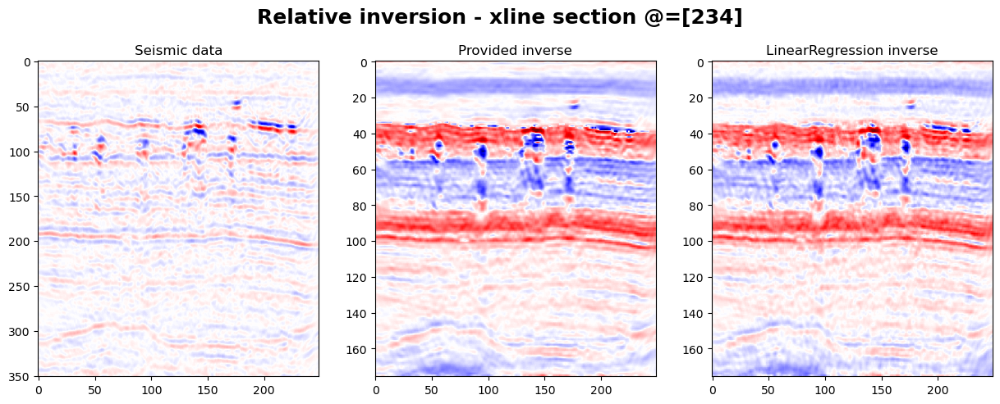

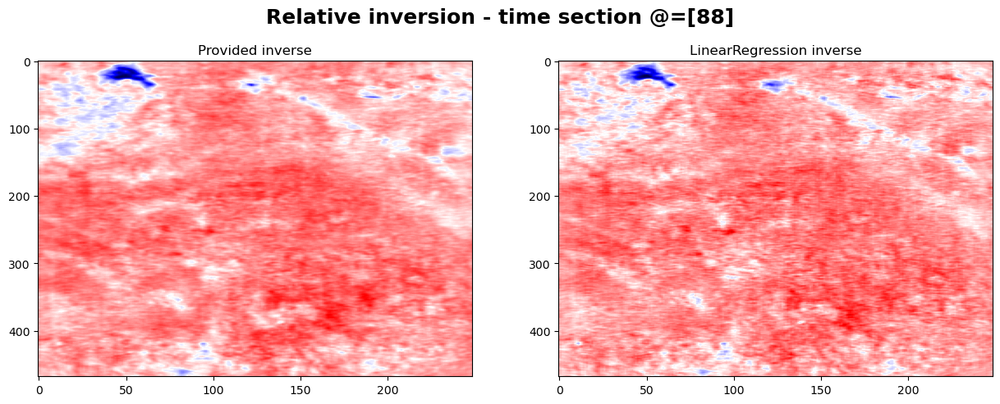

In [470]:
model_plotter(d_inv[...,::time_resampling],d_lr, model_name = "LinearRegression")

## MLP:

In [389]:
# Build the scikit-learn MLPRegressor model
from sklearn.neural_network import MLPRegressor

mlp = MLPRegressor(hidden_layer_sizes=(128,), max_iter=500)
mlp.fit(X_train, y_train)

MLPRegressor(hidden_layer_sizes=(128,), max_iter=500)

In [390]:
mlp.score(X_test, y_test)

0.868195513187037

In [391]:
y_pred_mlp = mlp.predict(X_test)

In [392]:
mean_squared_error(y_pred_mlp, y_test)

0.13341242

In [393]:
y_pred_mlp.shape

(3885, 176)

### Visuals:

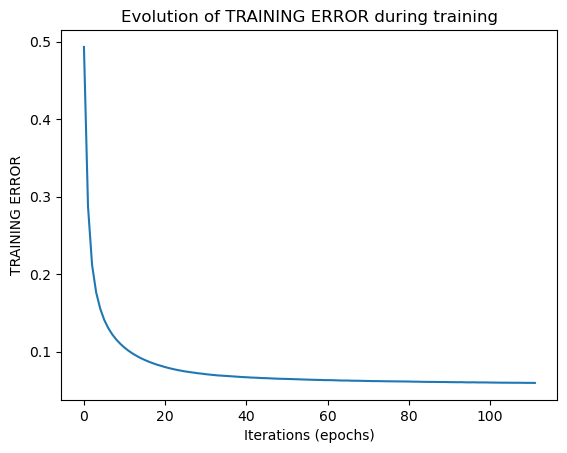

In [394]:
# Plot the LEARNING CURVE
plt.title("Evolution of TRAINING ERROR during training")
plt.xlabel("Iterations (epochs)")
plt.ylabel("TRAINING ERROR")
plt.plot(mlp.loss_curve_)
plt.show()

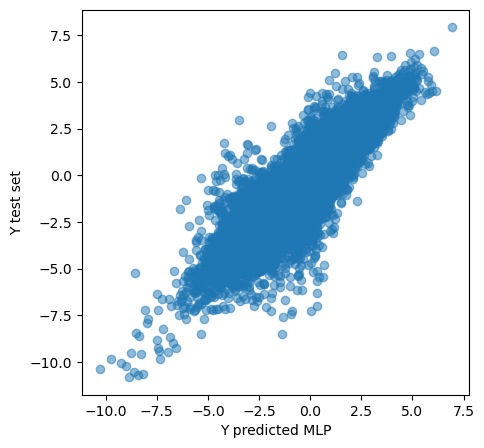

In [448]:
plt.figure(figsize=(5,5))
plt.scatter(y_pred_mlp,y_test, alpha=0.5)
plt.xlabel("Y predicted MLP")
plt.ylabel("Y test set")
plt.show()


In [396]:
d_small.shape

(249, 468, 351)

In [397]:
d_mlp = transform_predict(d_small[...,::time_resampling], mlp, scaler_X, scaler_Y)
d_mlp.shape

(249, 468, 176)

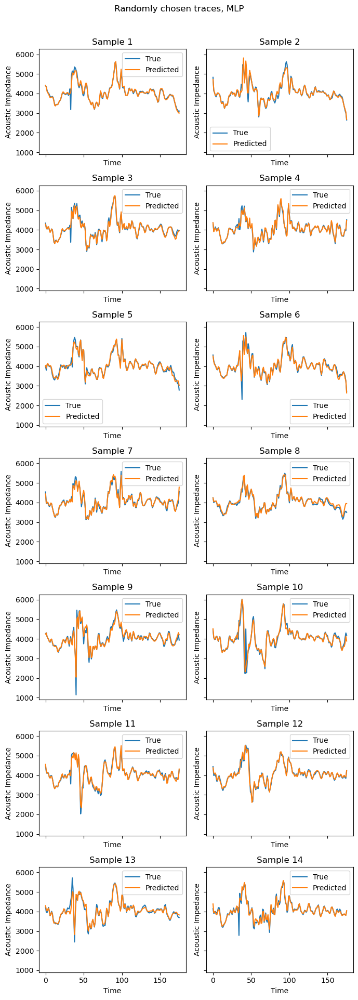

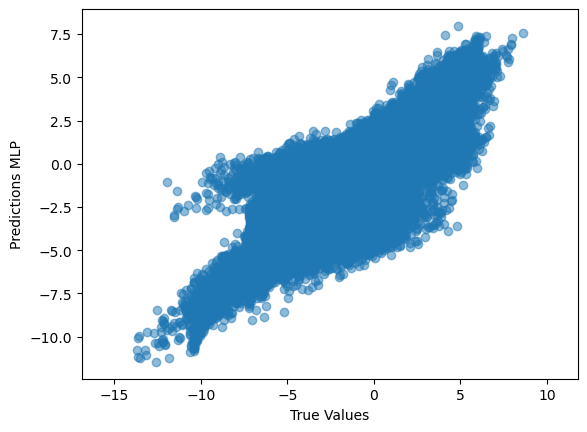

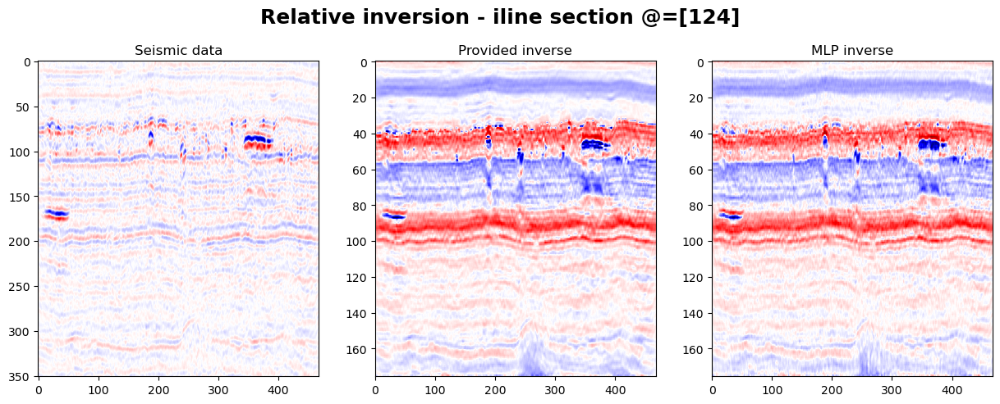

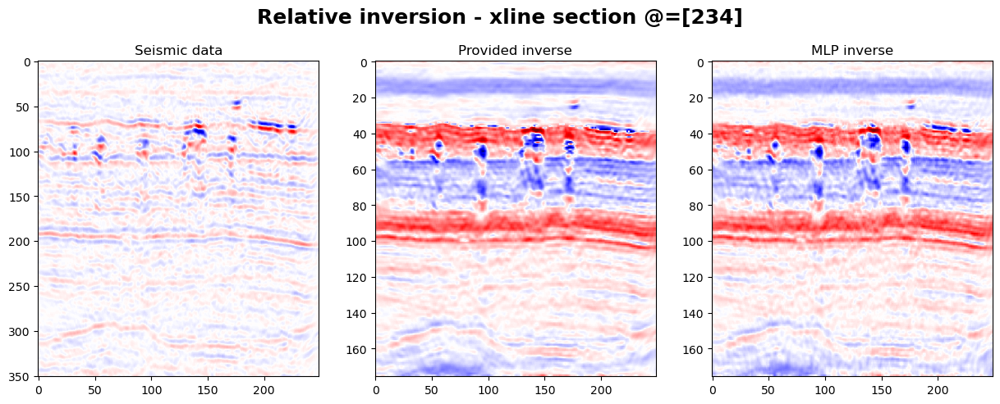

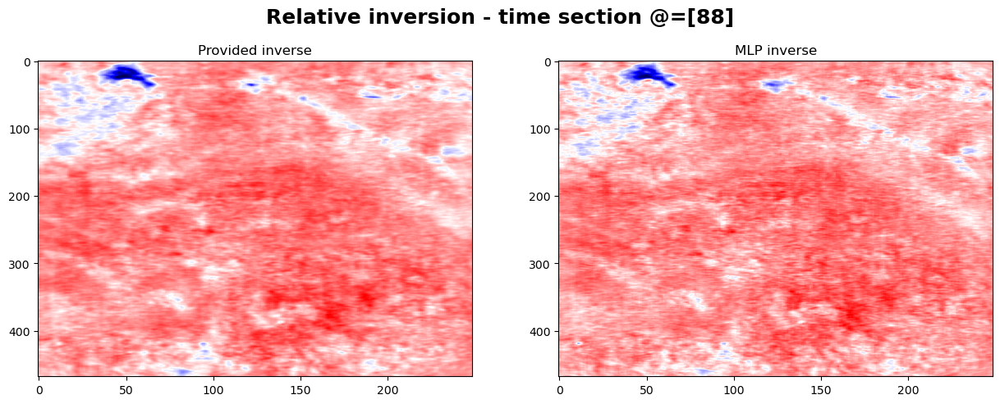

In [477]:
model_plotter(d_inv[...,::time_resampling],d_mlp,model_name="MLP")

## CNN

In [399]:
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten

input_length = X_test.shape[1]
cnn = Sequential()
cnn.add(Conv1D(filters=32, kernel_size=3, activation='relu', input_shape=(input_length, 1)))
cnn.add(MaxPooling1D(pool_size=2))
cnn.add(Conv1D(filters=64, kernel_size=3, activation='relu'))
cnn.add(MaxPooling1D(pool_size=2))
cnn.add(Conv1D(filters=128, kernel_size=3, activation='relu'))
cnn.add(MaxPooling1D(pool_size=2))
cnn.add(Flatten())
cnn.add(Dense(input_length, activation='linear'))

In [400]:
# Compile the model and fit it to the training data
cnn.compile(loss='mse', optimizer='adam')
history_cnn = cnn.fit(X_train, y_train, epochs=50, batch_size=16, validation_data=(X_test, y_test))


Epoch 1/50
567/567 [==============================] - 4s 7ms/step - loss: 0.3938 - val_loss: 0.2488
Epoch 2/50
567/567 [==============================] - 3s 6ms/step - loss: 0.2065 - val_loss: 0.2033
Epoch 3/50
567/567 [==============================] - 3s 5ms/step - loss: 0.1751 - val_loss: 0.1836
Epoch 4/50
567/567 [==============================] - 3s 5ms/step - loss: 0.1590 - val_loss: 0.1736
Epoch 5/50
567/567 [==============================] - 4s 6ms/step - loss: 0.1493 - val_loss: 0.1725
Epoch 6/50
567/567 [==============================] - 3s 5ms/step - loss: 0.1416 - val_loss: 0.1653
Epoch 7/50
567/567 [==============================] - 3s 5ms/step - loss: 0.1367 - val_loss: 0.1642
Epoch 8/50
567/567 [==============================] - 3s 5ms/step - loss: 0.1318 - val_loss: 0.1608
Epoch 9/50
567/567 [==============================] - 2s 4ms/step - loss: 0.1279 - val_loss: 0.1616
Epoch 10/50
567/567 [==============================] - 2s 4ms/step - loss: 0.1250 - val_loss: 0.1566

In [401]:
mean_squared_error(y_test, cnn.predict(X_test))

122/122 [==============================] - 0s 2ms/step


0.15023075

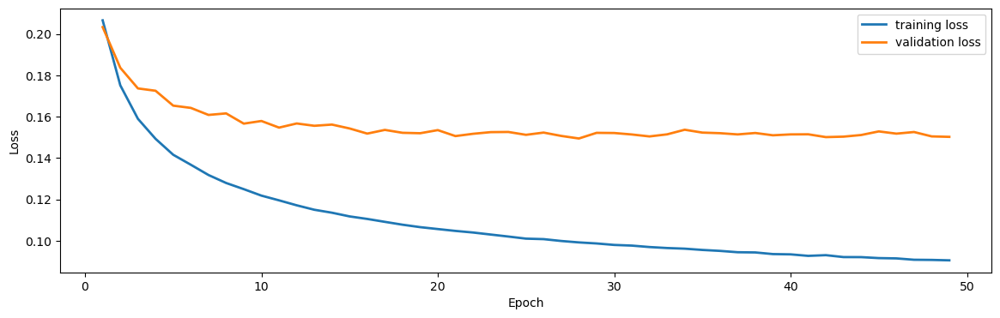

In [402]:
import pandas as pd

logs_cnn = pd.DataFrame(history_cnn.history)

plt.figure(figsize=(14, 4))
plt.plot(logs_cnn.loc[1:,"loss"], lw=2, label='training loss')
plt.plot(logs_cnn.loc[1:,"val_loss"], lw=2, label='validation loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [403]:
d_cnn = transform_predict(d_small[...,::time_resampling],cnn,scaler_X,scaler_Y)


3642/3642 [==============================] - 7s 2ms/step


### Visuals:

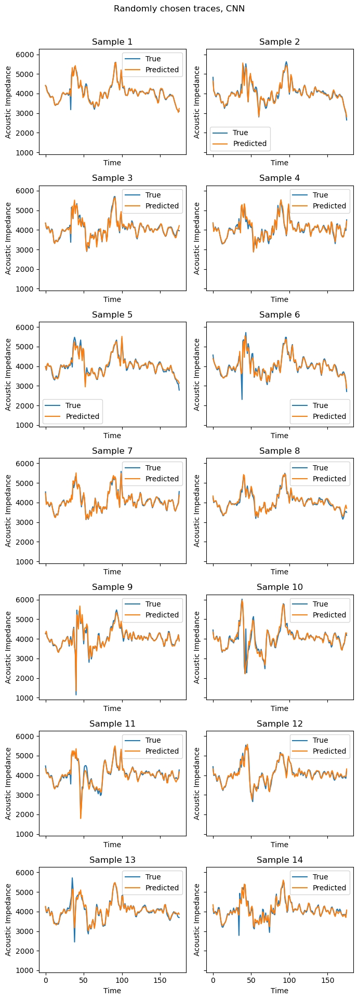

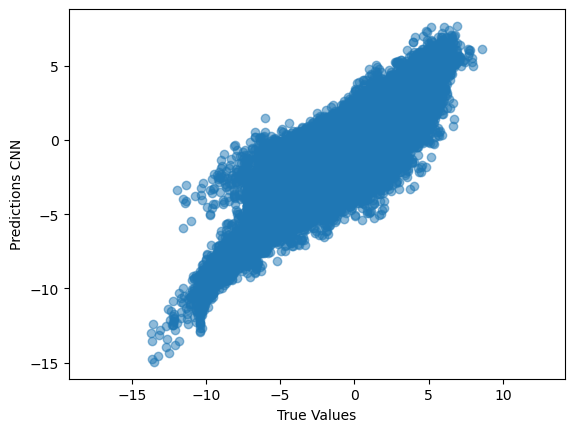

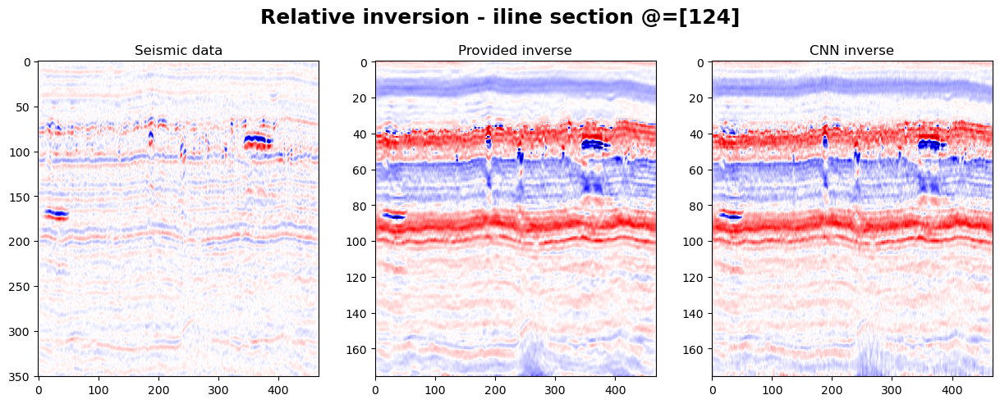

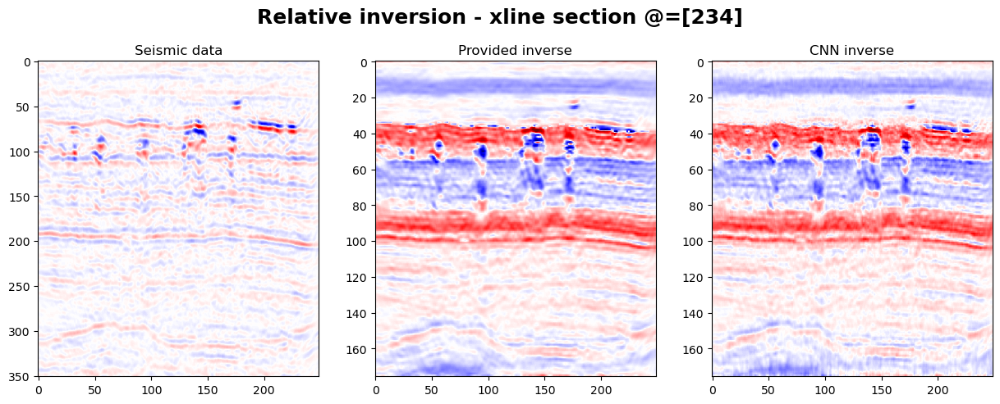

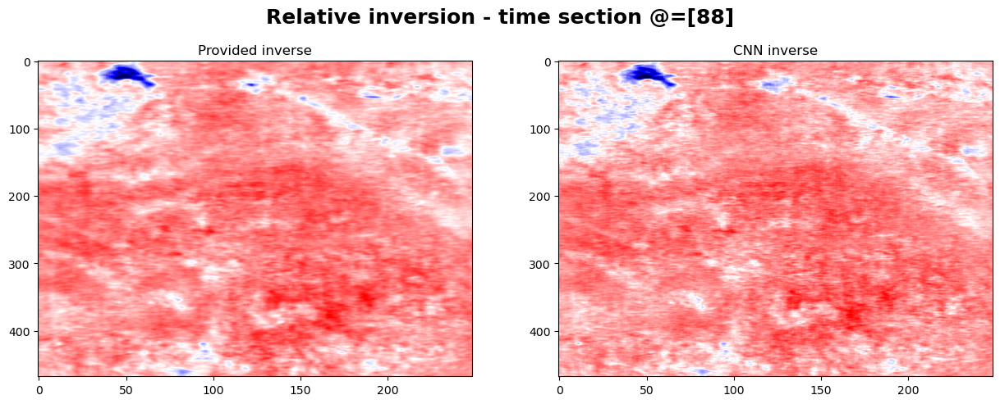

In [472]:
model_plotter(d_inv[...,::time_resampling],d_cnn,model_name="CNN")

## RNN:

In [407]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

model_rnn = Sequential()
model_rnn.add(LSTM(32, input_shape=(input_length, 1), return_sequences=True))
model_rnn.add(Dense(1, activation='linear'))

In [408]:
# Compile the model and fit it to the training data
model_rnn.compile(loss='mse', optimizer='adam')
history_rnn = model_rnn.fit(X_train, y_train, epochs=50, batch_size=16, validation_data=(X_test, y_test))


Epoch 1/50
567/567 [==============================] - 13s 19ms/step - loss: 0.4480 - val_loss: 0.3893
Epoch 2/50
567/567 [==============================] - 10s 18ms/step - loss: 0.3723 - val_loss: 0.3681
Epoch 3/50
567/567 [==============================] - 10s 18ms/step - loss: 0.3537 - val_loss: 0.3586
Epoch 4/50
567/567 [==============================] - 11s 19ms/step - loss: 0.3429 - val_loss: 0.3388
Epoch 5/50
567/567 [==============================] - 11s 19ms/step - loss: 0.3312 - val_loss: 0.3273
Epoch 6/50
567/567 [==============================] - 11s 19ms/step - loss: 0.3209 - val_loss: 0.3178
Epoch 7/50
567/567 [==============================] - 11s 20ms/step - loss: 0.3090 - val_loss: 0.3037
Epoch 8/50
567/567 [==============================] - 11s 20ms/step - loss: 0.2982 - val_loss: 0.2951
Epoch 9/50
567/567 [==============================] - 11s 20ms/step - loss: 0.2902 - val_loss: 0.3031
Epoch 10/50
567/567 [==============================] - 12s 22ms/step - loss: 0.284

In [445]:
model_rnn.evaluate(X_test, y_test)

122/122 [==============================] - 2s 14ms/step - loss: 0.2319


0.23187373578548431

In [409]:
d_rnn = transform_predict(d_small[...,::time_resampling],model_rnn,scaler_X,scaler_Y)

3642/3642 [==============================] - 30s 8ms/step


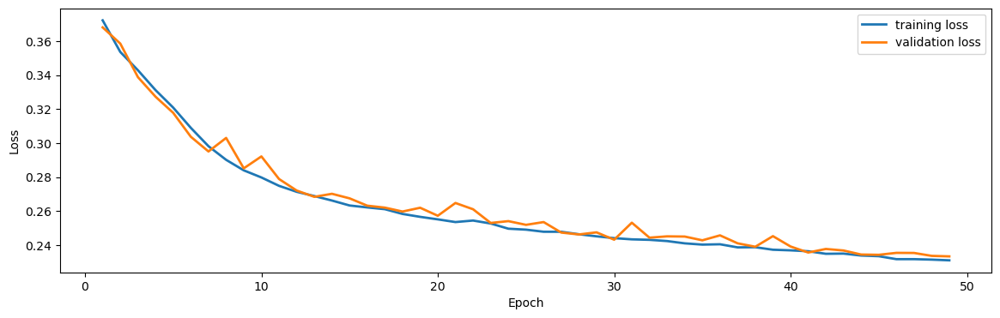

In [410]:
import pandas as pd

logs_rnn = pd.DataFrame(history_rnn.history)

plt.figure(figsize=(14, 4))
plt.plot(logs_rnn.loc[1:,"loss"], lw=2, label='training loss')
plt.plot(logs_rnn.loc[1:,"val_loss"], lw=2, label='validation loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

### Visuals:

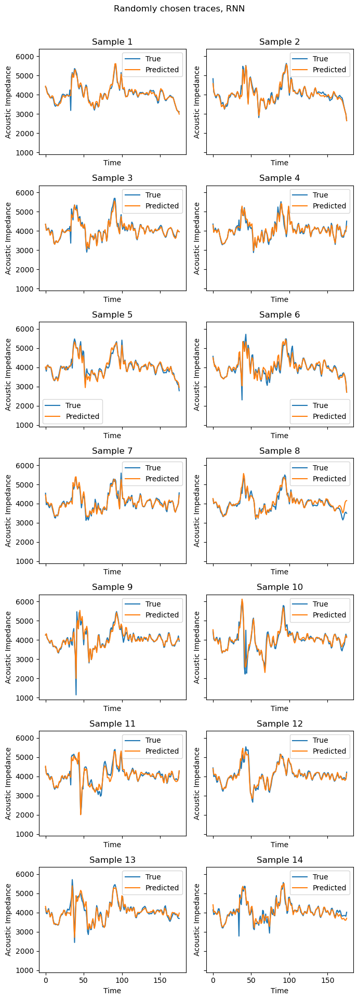

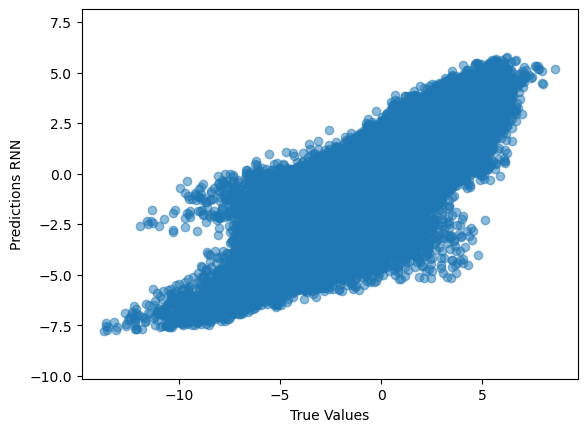

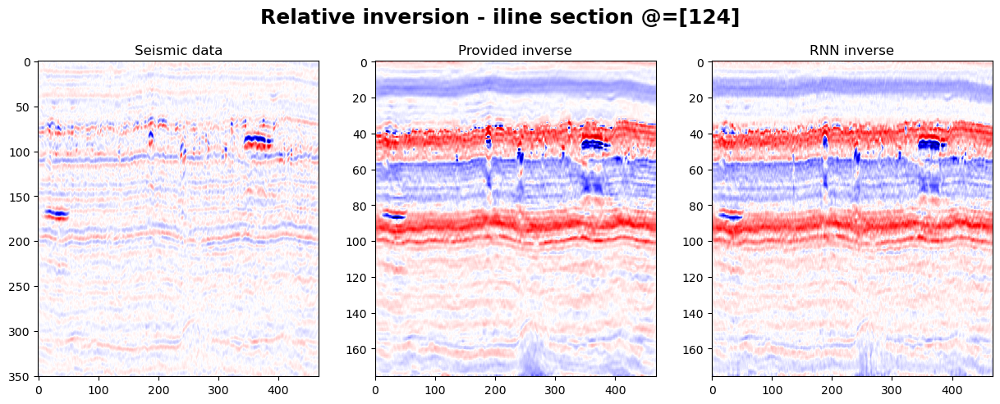

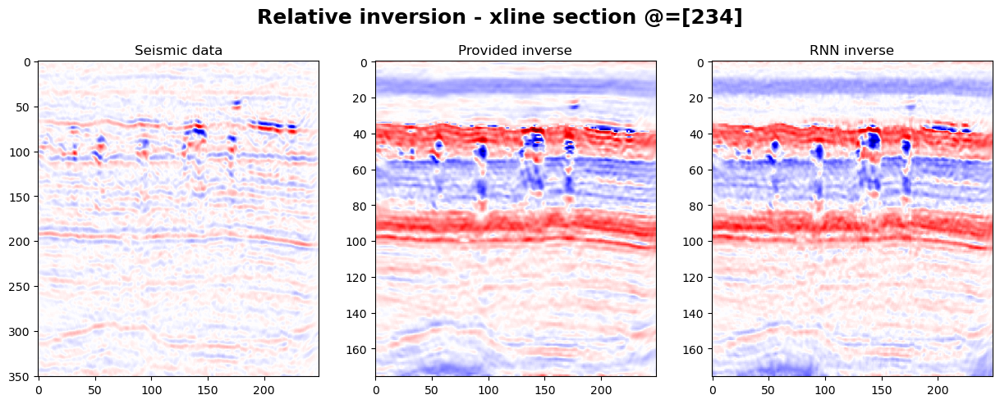

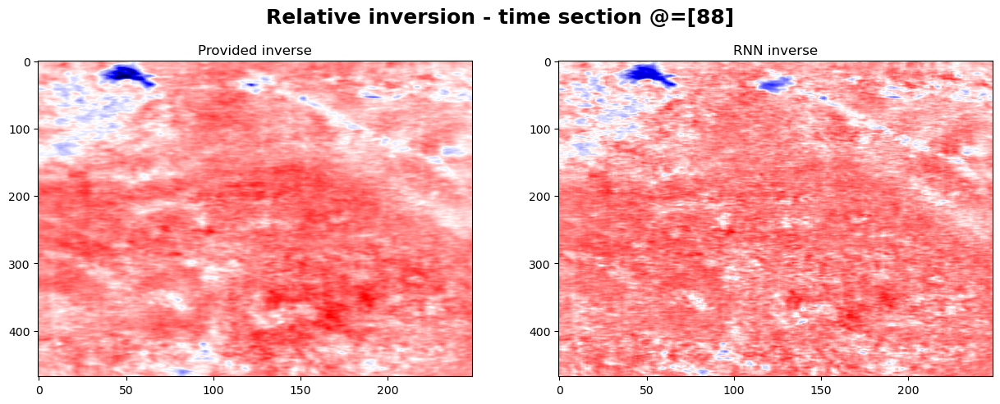

In [476]:
model_plotter(d_inv[...,::time_resampling],d_rnn,model_name="RNN")

## CRNN:

In [412]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, GRU, Dense

model_crnn = Sequential()

# Add a 1D convolutional layer
model_crnn.add(Conv1D(filters=32, kernel_size=3, activation='relu', input_shape=(input_length, 1)))

# Add a max pooling layer
model_crnn.add(MaxPooling1D(pool_size=2))

# Add a GRU layer
model_crnn.add(GRU(units=32, activation='tanh'))

# Add a dense output layer with linear activation
model_crnn.add(Dense(units=input_length, activation='linear'))

# Compile the model_crnn with mean squared error loss and Adam optimizer
model_crnn.compile(loss='mse', optimizer='adam')

In [444]:
model_crnn.evaluate(X_test, y_test)

122/122 [==============================] - 1s 11ms/step - loss: 0.5913


0.5913158059120178

In [413]:
# Compile the model and fit it to the training data
model_crnn.compile(loss='mse', optimizer='adam')
history_crnn = model_crnn.fit(X_train, y_train, epochs=50, batch_size=16, validation_data=(X_test, y_test))


Epoch 1/50
567/567 [==============================] - 9s 13ms/step - loss: 0.9340 - val_loss: 0.8962
Epoch 2/50
567/567 [==============================] - 6s 11ms/step - loss: 0.8598 - val_loss: 0.8446
Epoch 3/50
567/567 [==============================] - 7s 13ms/step - loss: 0.8272 - val_loss: 0.8243
Epoch 4/50
567/567 [==============================] - 6s 11ms/step - loss: 0.8104 - val_loss: 0.8237
Epoch 5/50
567/567 [==============================] - 6s 11ms/step - loss: 0.7975 - val_loss: 0.8001
Epoch 6/50
567/567 [==============================] - 6s 11ms/step - loss: 0.7857 - val_loss: 0.7959
Epoch 7/50
567/567 [==============================] - 6s 11ms/step - loss: 0.7745 - val_loss: 0.7819
Epoch 8/50
567/567 [==============================] - 6s 11ms/step - loss: 0.7664 - val_loss: 0.7859
Epoch 9/50
567/567 [==============================] - 6s 11ms/step - loss: 0.7579 - val_loss: 0.7611
Epoch 10/50
567/567 [==============================] - 6s 11ms/step - loss: 0.7491 - val_lo

In [414]:
d_crnn = transform_predict(d_small[...,::time_resampling],model_crnn,scaler_X,scaler_Y)

3642/3642 [==============================] - 17s 5ms/step


### Visuals:

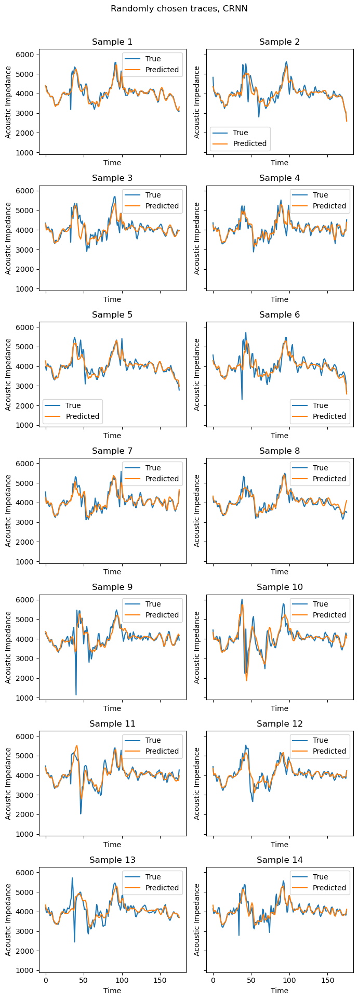

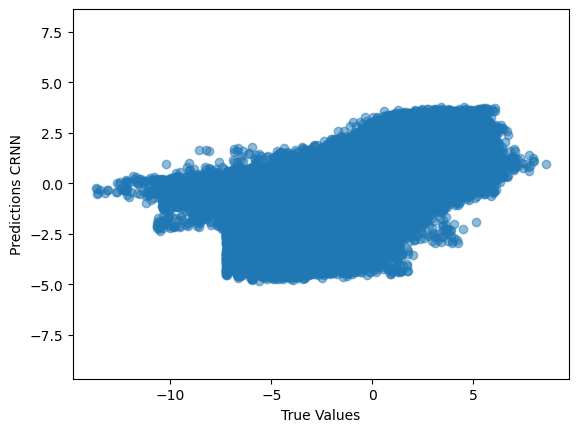

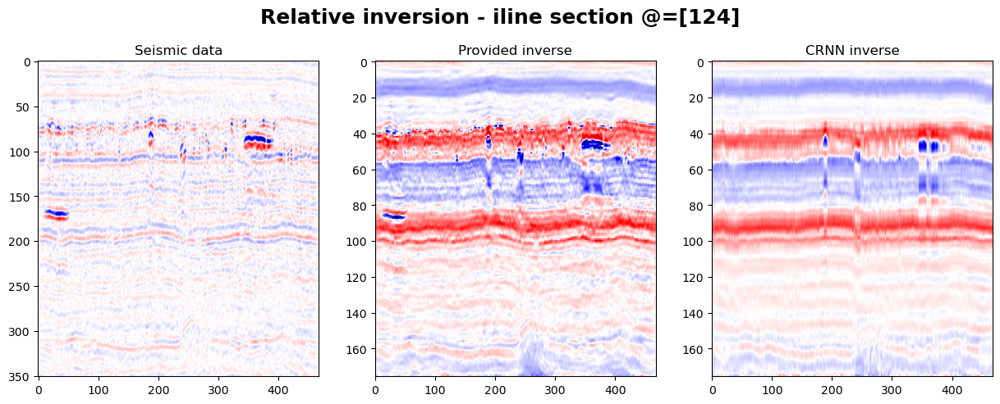

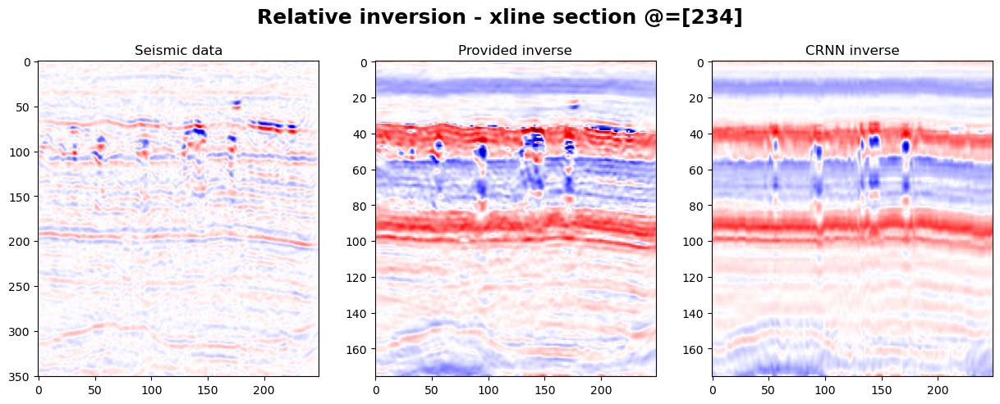

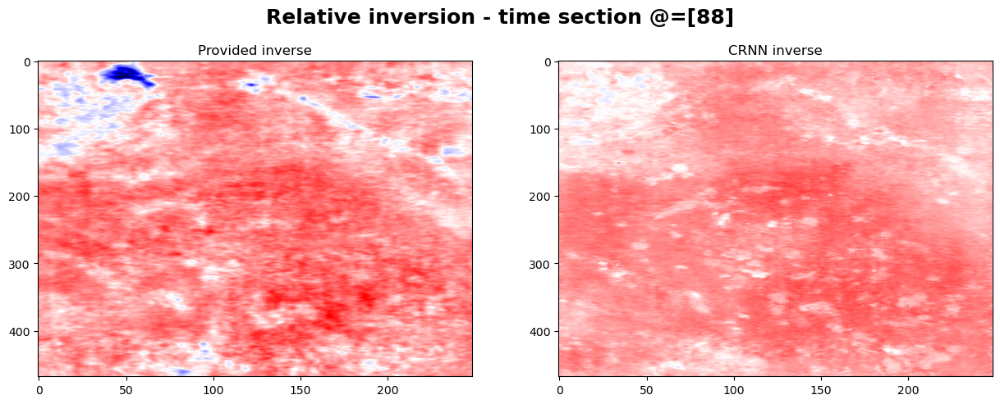

In [474]:
model_plotter(d_inv[...,::time_resampling],d_crnn,model_name="CRNN")

## TCN:

In [421]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 5006365594915853104
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 3643801600
locality {
  bus_id: 1
  links {
  }
}
incarnation: 13697555683505045892
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6"
xla_global_id: 416903419
]


In [422]:

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense
from tcn import TCN

# model = Sequential([
#     Input(shape=(350, 1)),
#     TCN(64, kernel_size=3, dilations=1, activation='relu', return_sequences=True),
#     TCN(32, kernel_size=3, dilations=2, activation='relu', return_sequences=True),
#     TCN(16, kernel_size=3, dilations=4, activation='relu', return_sequences=True),
#     Dense(1, activation='linear')
# ])
with tf.device('/GPU:0'):
    model_tcn = Sequential([
            TCN(input_shape=(int(x.shape[1]), 1), nb_filters=256, return_sequences=True, dilations=[1, 2, 4, 8, 16, 32], activation="ReLU"),
            Dense(1, activation='linear')
        ])
    model_tcn.compile(loss='mean_squared_error', optimizer='adam')
    
    history = model_tcn.fit(X_train, y_train, epochs=60, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/60
284/284 [==============================] - 14s 40ms/step - loss: 99.1007 - val_loss: 0.4730
Epoch 2/60
284/284 [==============================] - 11s 38ms/step - loss: 0.4261 - val_loss: 0.4046
Epoch 3/60
284/284 [==============================] - 11s 38ms/step - loss: 0.3846 - val_loss: 0.3752
Epoch 4/60
284/284 [==============================] - 11s 38ms/step - loss: 0.3631 - val_loss: 0.3625
Epoch 5/60
284/284 [==============================] - 11s 38ms/step - loss: 0.3494 - val_loss: 0.3449
Epoch 6/60
284/284 [==============================] - 11s 40ms/step - loss: 0.3394 - val_loss: 0.3599
Epoch 7/60
284/284 [==============================] - 11s 38ms/step - loss: 0.3281 - val_loss: 0.3379
Epoch 8/60
284/284 [==============================] - 11s 39ms/step - loss: 0.3168 - val_loss: 0.3357
Epoch 9/60
284/284 [==============================] - 11s 38ms/step - loss: 0.3085 - val_loss: 0.3066
Epoch 10/60
284/284 [==============================] - 11s 38ms/step - loss: 0.30

In [423]:
model_tcn.evaluate(X_test, y_test)

122/122 [==============================] - 2s 14ms/step - loss: 0.1904


0.19036813080310822

In [424]:
y_pred = model_tcn.predict(X_test)

122/122 [==============================] - 2s 14ms/step


### Save the model:

In [425]:
# Save the entire model as a SavedModel.
!mkdir saved_model
model.save('saved_model/tcn_60')

A subdirectory or file saved_model already exists.


INFO:tensorflow:Assets written to: saved_model/tcn_60\assets


INFO:tensorflow:Assets written to: saved_model/tcn_60\assets


In [426]:
# # Check if loading works:
# new_model = tf.keras.models.load_model('saved_model/tcn')

# # Check its architecture
# new_model.summary()

### Visuals:

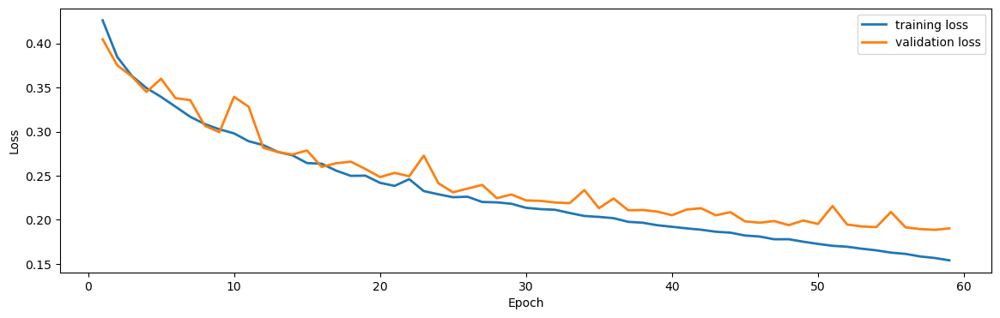

In [427]:
import pandas as pd

logs_tcn = pd.DataFrame(history.history)

plt.figure(figsize=(14, 4))
plt.plot(logs_tcn.loc[1:,"loss"], lw=2, label='training loss')
plt.plot(logs_tcn.loc[1:,"val_loss"], lw=2, label='validation loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend(loc='upper right')
plt.show()

In [428]:
model_tcn = tf.keras.models.load_model('saved_model/tcn')

In [429]:
model_tcn.predict(X_test[:10])[:,:,0].shape

1/1 [==============================] - 0s 345ms/step


(10, 176)

In [430]:
d_tcn = transform_predict(d_small[...,::time_resampling],model_tcn,scaler_X,scaler_Y)

3642/3642 [==============================] - 52s 14ms/step


In [431]:
d_small[...,::time_resampling].shape

(249, 468, 176)

In [432]:
d_tcn.shape

(249, 468, 176)

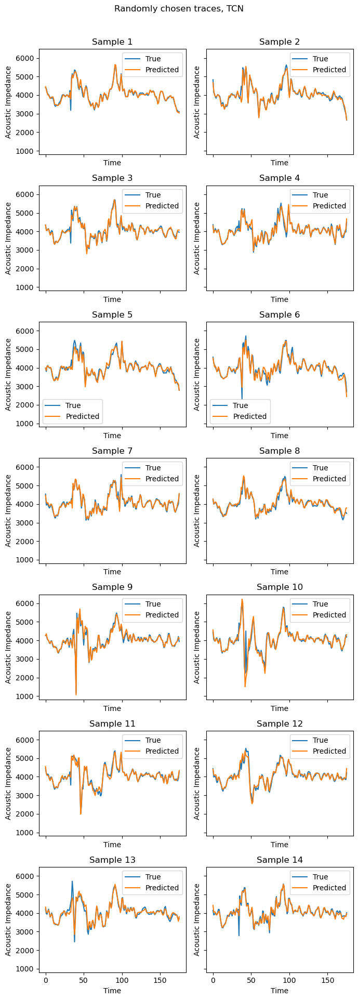

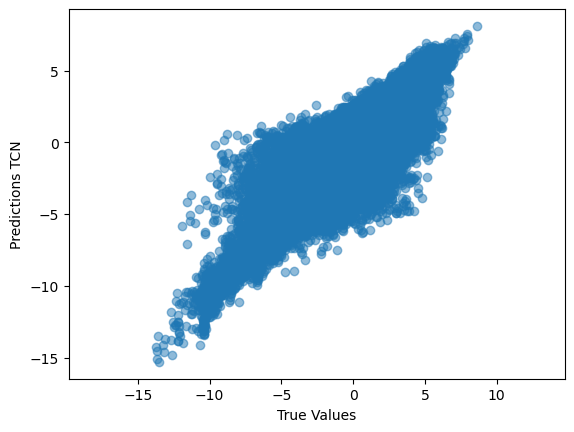

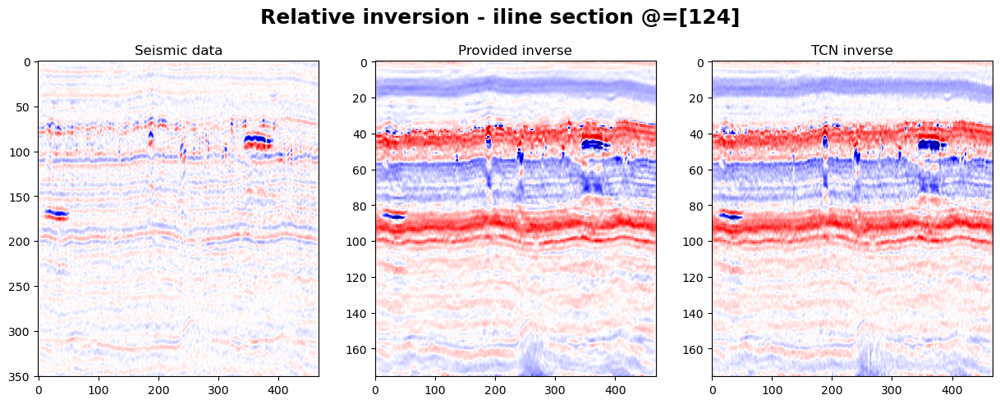

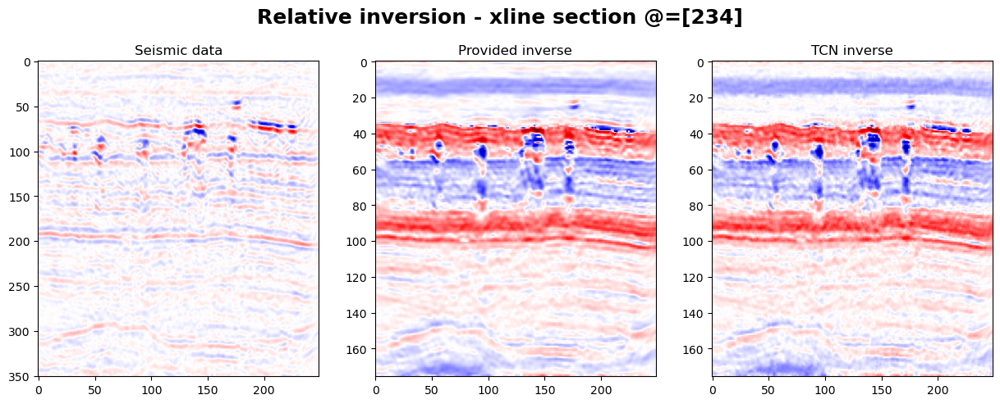

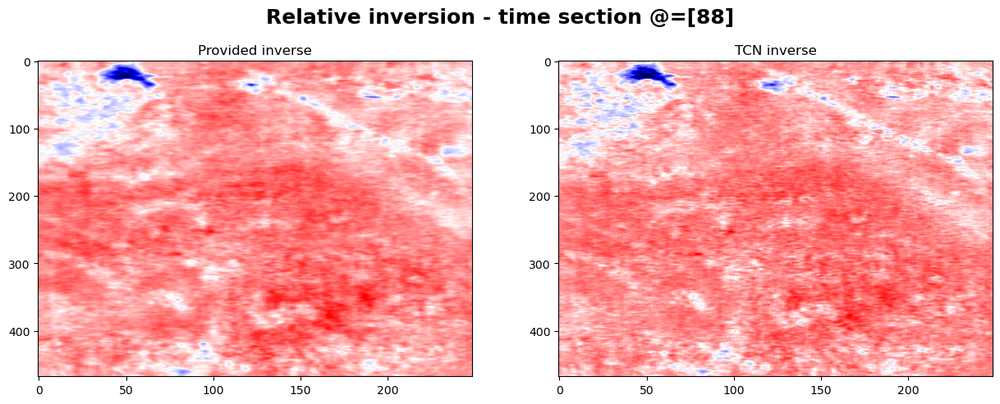

In [475]:
model_plotter(d_inv[...,::time_resampling],d_tcn,model_name="TCN")

In [438]:
# model_tcn60 = tf.keras.models.load_model('saved_model/tcn_60')

# model_tcn60.summary()

In [435]:
model_tcn100 = tf.keras.models.load_model('saved_model/tcn_100')

model_tcn100.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 tcn_1 (TCN)                 (None, 176, 256)          2167040   
                                                                 
 dense_1 (Dense)             (None, 176, 1)            257       
                                                                 
Total params: 2,167,297
Trainable params: 2,167,297
Non-trainable params: 0
_________________________________________________________________


In [436]:
model_tcn.evaluate(X_test, y_test)

122/122 [==============================] - 2s 15ms/step - loss: 0.1695


0.16950352489948273

In [439]:
# model_tcn60.evaluate(X_test, y_test)

In [ ]:
model_tcn100.evaluate(X_test, y_test)

122/122 [==============================] - 2s 14ms/step - loss: 0.2078


0.20775417983531952

## K-Fold TCN:

We expect to get less biased model, however this will affect our MS Error.

(No overfitting -> less accuracy)

In [486]:
from sklearn.model_selection import KFold
from tensorflow import keras
import tensorflow as tf

n_epochs = 50
n_splits =  5
n_features = 1

kf = KFold(n_splits=n_splits, shuffle=True)

for fold, (train_idx, test_idx) in enumerate(kf.split(X_train, y_train)):
    print('-'*15, '>', f'Fold {fold+1}', '<', '-'*15)
    X_train_k, X_valid_k = X_train[train_idx], X_train[test_idx]
    y_train_k, y_valid_k = y_train[train_idx], y_train[test_idx]
    
    # scheduler = tf.keras.optimizers.schedules.ExponentialDecay(1e-3, 200*((len(X_test)*0.8)/1024), 1e-5)
    
    tcn_k = Sequential([
        TCN(input_shape=(X_train.shape[1], n_features), nb_filters=256, return_sequences=True, dilations=[1, 2, 4, 8, 16, 32]),
        Dense(1)
    ])
    
    tcn_k.compile(optimizer="adam", loss='mean_squared_error')
    
    history = tcn_k.fit(X_train_k, y_train_k, 
                        validation_data=(X_valid_k, y_valid_k), 
                        epochs=n_epochs, 
                        batch_size=32, 
                        # callbacks=[tf.keras.callbacks.LearningRateScheduler(scheduler)]
                        )
    
    tcn_k.save(f'Fold{fold+1} weights')

--------------- > Fold 1 < ---------------
Epoch 1/50
227/227 [==============================] - 11s 36ms/step - loss: 168.3989 - val_loss: 0.4666
Epoch 2/50
227/227 [==============================] - 8s 35ms/step - loss: 0.4261 - val_loss: 0.4064
Epoch 3/50
227/227 [==============================] - 8s 37ms/step - loss: 0.3867 - val_loss: 0.3779
Epoch 4/50
227/227 [==============================] - 8s 37ms/step - loss: 0.3690 - val_loss: 0.3701
Epoch 5/50
227/227 [==============================] - 9s 39ms/step - loss: 0.3555 - val_loss: 0.3606
Epoch 6/50
227/227 [==============================] - 9s 39ms/step - loss: 0.3435 - val_loss: 0.3457
Epoch 7/50
227/227 [==============================] - 9s 40ms/step - loss: 0.3356 - val_loss: 0.3336
Epoch 8/50
227/227 [==============================] - 9s 40ms/step - loss: 0.3305 - val_loss: 0.3233
Epoch 9/50
227/227 [==============================] - 9s 41ms/step - loss: 0.3196 - val_loss: 0.3261
Epoch 10/50
227/227 [========================

INFO:tensorflow:Assets written to: Fold1 weights\assets


INFO:tensorflow:Assets written to: Fold1 weights\assets


--------------- > Fold 2 < ---------------
Epoch 1/50
227/227 [==============================] - 13s 42ms/step - loss: 312.3037 - val_loss: 0.4861
Epoch 2/50
227/227 [==============================] - 9s 41ms/step - loss: 0.4451 - val_loss: 0.4179
Epoch 3/50
227/227 [==============================] - 9s 41ms/step - loss: 0.4026 - val_loss: 0.3912
Epoch 4/50
227/227 [==============================] - 10s 42ms/step - loss: 0.3804 - val_loss: 0.3733
Epoch 5/50
227/227 [==============================] - 10s 43ms/step - loss: 0.3666 - val_loss: 0.3591
Epoch 6/50
227/227 [==============================] - 10s 43ms/step - loss: 0.3546 - val_loss: 0.3509
Epoch 7/50
227/227 [==============================] - 10s 44ms/step - loss: 0.3488 - val_loss: 0.3528
Epoch 8/50
227/227 [==============================] - 10s 43ms/step - loss: 0.3409 - val_loss: 0.3431
Epoch 9/50
227/227 [==============================] - 10s 42ms/step - loss: 0.3345 - val_loss: 0.3279
Epoch 10/50
227/227 [==================

INFO:tensorflow:Assets written to: Fold2 weights\assets


INFO:tensorflow:Assets written to: Fold2 weights\assets


--------------- > Fold 3 < ---------------
Epoch 1/50
227/227 [==============================] - 12s 41ms/step - loss: 235.8813 - val_loss: 0.4645
Epoch 2/50
227/227 [==============================] - 9s 41ms/step - loss: 0.4303 - val_loss: 0.4033
Epoch 3/50
227/227 [==============================] - 11s 47ms/step - loss: 0.3937 - val_loss: 0.3816
Epoch 4/50
227/227 [==============================] - 10s 45ms/step - loss: 0.3707 - val_loss: 0.3664
Epoch 5/50
227/227 [==============================] - 10s 44ms/step - loss: 0.3577 - val_loss: 0.3644
Epoch 6/50
227/227 [==============================] - 10s 43ms/step - loss: 0.3502 - val_loss: 0.3417
Epoch 7/50
227/227 [==============================] - 10s 44ms/step - loss: 0.3391 - val_loss: 0.3395
Epoch 8/50
227/227 [==============================] - 10s 43ms/step - loss: 0.3353 - val_loss: 0.3316
Epoch 9/50
227/227 [==============================] - 10s 44ms/step - loss: 0.3308 - val_loss: 0.3425
Epoch 10/50
227/227 [=================

INFO:tensorflow:Assets written to: Fold3 weights\assets


INFO:tensorflow:Assets written to: Fold3 weights\assets


--------------- > Fold 4 < ---------------
Epoch 1/50
227/227 [==============================] - 13s 42ms/step - loss: 152.1076 - val_loss: 0.4672
Epoch 2/50
227/227 [==============================] - 10s 43ms/step - loss: 0.4138 - val_loss: 0.3895
Epoch 3/50
227/227 [==============================] - 10s 44ms/step - loss: 0.3773 - val_loss: 0.3684
Epoch 4/50
227/227 [==============================] - 11s 46ms/step - loss: 0.3623 - val_loss: 0.3804
Epoch 5/50
227/227 [==============================] - 10s 46ms/step - loss: 0.3467 - val_loss: 0.3408
Epoch 6/50
227/227 [==============================] - 10s 45ms/step - loss: 0.3393 - val_loss: 0.3420
Epoch 7/50
227/227 [==============================] - 10s 44ms/step - loss: 0.3306 - val_loss: 0.3379
Epoch 8/50
227/227 [==============================] - 9s 40ms/step - loss: 0.3233 - val_loss: 0.3340
Epoch 9/50
227/227 [==============================] - 9s 41ms/step - loss: 0.3216 - val_loss: 0.3126
Epoch 10/50
227/227 [==================

INFO:tensorflow:Assets written to: Fold4 weights\assets


INFO:tensorflow:Assets written to: Fold4 weights\assets


--------------- > Fold 5 < ---------------
Epoch 1/50
227/227 [==============================] - 11s 36ms/step - loss: 165.9149 - val_loss: 0.4415
Epoch 2/50
227/227 [==============================] - 8s 34ms/step - loss: 0.4137 - val_loss: 0.3848
Epoch 3/50
227/227 [==============================] - 8s 35ms/step - loss: 0.3790 - val_loss: 0.3615
Epoch 4/50
227/227 [==============================] - 8s 35ms/step - loss: 0.3616 - val_loss: 0.3480
Epoch 5/50
227/227 [==============================] - 8s 36ms/step - loss: 0.3477 - val_loss: 0.3351
Epoch 6/50
227/227 [==============================] - 8s 36ms/step - loss: 0.3374 - val_loss: 0.3463
Epoch 7/50
227/227 [==============================] - 8s 37ms/step - loss: 0.3282 - val_loss: 0.3178
Epoch 8/50
227/227 [==============================] - 8s 37ms/step - loss: 0.3191 - val_loss: 0.3111
Epoch 9/50
227/227 [==============================] - 9s 37ms/step - loss: 0.3119 - val_loss: 0.3034
Epoch 10/50
227/227 [========================

INFO:tensorflow:Assets written to: Fold5 weights\assets


INFO:tensorflow:Assets written to: Fold5 weights\assets


In [489]:
model.evaluate(X_test,y_test)

122/122 [==============================] - 2s 14ms/step - loss: 0.3347


0.33466705679893494

Text(0, 0.5, 'Loss')

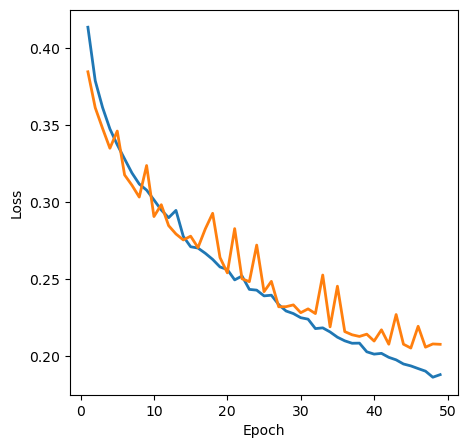

In [490]:
logs = pd.DataFrame(history.history)

plt.figure(figsize=(5, 5))
plt.plot(logs.loc[1:,"loss"], lw=2, label='training loss')
plt.plot(logs.loc[1:,"val_loss"], lw=2, label='validation loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")

## Time-freq analysis:

Code below is incomplete as it is generated by chatgpt.

In [ ]:
yn.shape

(12948, 176)

In [ ]:
# from scipy import signal
# import numpy as np

# # Generate random seismic and acoustic impedance data
# seismic_data = xn
# acoustic_impedance = yn

# # Define STFT parameters
# window = 'hann'
# nperseg = 64
# noverlap = nperseg // 2

# # Compute STFT
# f, t, Zxx = signal.stft(seismic_data, window=window, nperseg=nperseg, noverlap=noverlap)

# # Take absolute value of STFT (magnitude spectrum)
# Zxx = np.abs(Zxx)

# # Reshape to 2D array for model input
# X_stft = Zxx.T.reshape(-1, nperseg//2+1)

# # Compute STFT of acoustic impedance data
# _, _, Zxx_y = signal.stft(acoustic_impedance, window=window, nperseg=nperseg, noverlap=noverlap)

# # Take absolute value of STFT (magnitude spectrum)
# Zxx_y = np.abs(Zxx_y)

# # Reshape to 2D array for model output
# Y_stft = Zxx_y.T.reshape(-1, nperseg//2+1)

# # Split data into training and testing sets
# split_idx = int(X_stft.shape[0] * 0.8)
# X_train, X_test = X_stft[:split_idx], X_stft[split_idx:]
# Y_train, Y_test = Y_stft[:split_idx], Y_stft[split_idx:]

# # Build model
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Dense, LSTM, Dropout

# model = Sequential()
# model.add(LSTM(64, input_shape=(X_train.shape[1], 1), return_sequences=True))
# model.add(Dropout(0.2))
# model.add(LSTM(32))
# model.add(Dense(32))
# model.add(Dense(Y_train.shape[1]))

# model.compile(loss='mse', optimizer='adam')

# # Train model
# model.fit(X_train[..., np.newaxis], Y_train, epochs=10, batch_size=32, validation_split=0.2)

# # Evaluate model on test set
# loss = model.evaluate(X_test[..., np.newaxis], Y_test)
# print('Test loss:', loss)

# # Predict on test set
# Y_pred_stft = model.predict(X_test[..., np.newaxis])

# # Reshape predicted STFT to match original shape of acoustic impedance data
# Y_pred = np.zeros((Y_test.shape[0], Y_test.shape[1], 2), dtype=np.float32)
# Y_pred[..., 0] = np.real(Y_pred_stft)
# Y_pred[..., 1] = np.imag(Y_pred_stft)
# _, _, Y_pred_time = signal.istft(Y_pred, window=window, nperseg=nperseg, noverlap=noverlap)

# # Print shape of predicted time-domain data
# print('Shape of predicted time-domain data:', Y_pred_time.shape)


In [ ]:
# _, Y_pred_time = signal.istft(Y_pred, window=window, nperseg=nperseg, noverlap=noverlap)
# print('Shape of predicted time-domain data:', Y_pred_time.shape)


Shape of predicted time-domain data: (18128, 32)
